In [74]:
%load_ext autoreload
%autoreload 2

import optuna
import pandas as pd
import lightgbm as lgb
import matplotlib.pyplot as plt
import shap
import numpy as np
import scipy
import seaborn as sns
import lightgbm as lgb
import numpy as np
import sklearn.datasets
import sklearn.metrics
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, roc_auc_score
import pickle

from utils.model import Metrics, save_model, load_model

SEED = 42

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [35]:
from transform.load_data import LoadData

loader = LoadData()

# loader.df_train_fe -> (150000, 817)
# loader.df_test_fe -> (150000, 817)

# loader.df_train_bnum -> (671248, 8)
# loader.df_test_bnum -> (669540, 8)

# loader.df_train_dpi -> (6745887, 6)
# loader.df_test_dpi -> (6739211, 6)



## Prepare Data


In [75]:
from utils.pipeline import Pipeline, PipelineStep

from utils.helpers import reduce_mem_usage
from transform.set_missings import set_missings, drop_fraud
from transform.load_data import load_train_data, load_test_data
from transform.feature_selection import feature_selection
from transform.dpi_features import generate_test_dpi_feature, generate_train_dpi_feature
from transform.bnum_features import generate_test_bnum_feature, generate_train_bnum_feature
from transform.fe_features import generate_test_fe_feature, generate_train_fe_feature


def remove_abon_id(df):
    return df.drop("abon_id", axis=1)


transform_train_pipeline = Pipeline(
    "TRANSFORM_TRAIN",
    [
        # Load data
        PipelineStep(load_train_data),
        PipelineStep(set_missings),
        PipelineStep(reduce_mem_usage),
        # New features
        PipelineStep(generate_train_fe_feature),
        PipelineStep(generate_train_dpi_feature),
        PipelineStep(generate_train_bnum_feature),
        PipelineStep(drop_fraud),
        # Feature selection
        PipelineStep(remove_abon_id),
        PipelineStep(feature_selection),
    ],
)

transform_test_pipeline = Pipeline(
    "TRANSFORM_TEST",
    [
        # Load data
        PipelineStep(load_test_data),
        PipelineStep(set_missings),
        PipelineStep(reduce_mem_usage),
        # New features
        PipelineStep(generate_test_fe_feature),
        PipelineStep(generate_test_dpi_feature),
        PipelineStep(generate_test_bnum_feature),
        # Feature selection
        PipelineStep(remove_abon_id),
        PipelineStep(feature_selection),
    ],
)

In [76]:
train_data = transform_train_pipeline.run()

print("Shape:", train_data.shape)

2024-07-16 23:34:20 - Running pipeline: TRANSFORM_TRAIN (0:07:40)
2024-07-16 23:34:20 - 0. Running step: load_train_data (0:07:40)
2024-07-16 23:34:20 - 1. Running step: set_missings (0:07:40)
2024-07-16 23:34:22 - 2. Running step: reduce_mem_usage (0:07:43)
2024-07-16 23:34:23 - 3. Running step: generate_train_fe_feature (0:07:44)


Mem. usage decreased to 226.02 Mb (75.5% reduction)


2024-07-16 23:34:24 - 4. Running step: generate_train_dpi_feature (0:07:44)
2024-07-16 23:34:24 - 5. Running step: generate_train_bnum_feature (0:07:45)
2024-07-16 23:34:25 - 6. Running step: drop_fraud (0:07:45)
2024-07-16 23:34:25 - 7. Running step: remove_abon_id (0:07:46)
2024-07-16 23:34:25 - 8. Running step: feature_selection (0:07:46)
2024-07-16 23:34:25 - 10. Done (0:07:46)


-----------------

Shape: (149998, 58)


In [77]:
test_data = transform_test_pipeline.run()

print("Shape:", test_data.shape)

2024-07-16 23:34:26 - Running pipeline: TRANSFORM_TEST (0:07:47)
2024-07-16 23:34:26 - 0. Running step: load_test_data (0:07:47)
2024-07-16 23:34:26 - 1. Running step: set_missings (0:07:47)
2024-07-16 23:34:28 - 2. Running step: reduce_mem_usage (0:07:49)
2024-07-16 23:34:29 - 3. Running step: generate_test_fe_feature (0:07:50)


Mem. usage decreased to 225.88 Mb (75.5% reduction)


2024-07-16 23:34:30 - 4. Running step: generate_test_dpi_feature (0:07:50)
2024-07-16 23:34:30 - 5. Running step: generate_test_bnum_feature (0:07:51)
2024-07-16 23:34:31 - 6. Running step: remove_abon_id (0:07:51)
2024-07-16 23:34:31 - 7. Running step: feature_selection (0:07:52)
2024-07-16 23:34:31 - 9. Done (0:07:52)


-----------------

Shape: (150000, 58)


In [103]:
# train_cache_key = "cache/train_data_pipeline.pkl"
# test_cache_key = "cache/test_data_pipeline.pkl"

# # # Save train / test data
# # with open(train_cache_key, "wb") as f:
# #     pickle.dump(train_data, f)

# # with open(test_cache_key, "wb") as f:
# #     pickle.dump(test_data, f)

# # Load train / test data
# with open(train_cache_key, "rb") as f:
#     train_data = pickle.load(f)

# with open(test_cache_key, "rb") as f:
#     test_data = pickle.load(f)

## Studies

You can find more details in `research/studies`. This folder contains all study strategies I tried
In this section I'll focus on best results I received

In [71]:
import json
import optuna
from utils.helpers import create_or_load_optuna_study
from utils.model import save_model
from imblearn.over_sampling import SMOTE
import sklearn
import random
from sklearn.model_selection import train_test_split
import warnings
from imblearn.under_sampling import RandomUnderSampler

warnings.filterwarnings("ignore")

np.random.seed(SEED)
random.seed(SEED)

VERSION = "new_features_v1"

print("Train data shape:", train_data.shape)

sub_train_x, sub_val_x, sub_train_y, sub_val_y = train_test_split(
    train_data.drop(columns="target"),
    train_data.target,
    test_size=0.2,
    random_state=SEED,
    stratify=train_data.target,
)

sub_train_data = sub_train_x.copy()
sub_train_data["target"] = sub_train_y

resampled_x, resampled_y = oversampling(sub_train_data, not_churned_size=0.7, churned_size=0.7)

dtrain = lgb.Dataset(resampled_x, label=resampled_y)
dvalid = lgb.Dataset(sub_val_x, label=sub_val_y)

static_params = {
    "random_state": SEED,
    "seed": SEED,
    "objective": "binary",
    "metric": "auc",
    "verbosity": -1,
    "boosting_type": "gbdt",
    "feature_pre_filter": False,
    "early_stopping_rounds": 120,
    "n_jobs": -1,
}


def objective(trial):
    params = {
        **static_params,
        "lambda_l1": trial.suggest_int("lambda_l1", 4, 12),
        "lambda_l2": trial.suggest_int("lambda_l2", 4, 12),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.06, log=True),
        "num_leaves": trial.suggest_int("num_leaves", 10, 40, step=2),
        "feature_fraction": trial.suggest_float("feature_fraction", 0.2, 1.0),
        "bagging_fraction": trial.suggest_float("bagging_fraction", 0.2, 1.0),
        "max_depth": trial.suggest_int("max_depth", 9, 15),
        "min_child_samples": trial.suggest_int("min_child_samples", 10, 150, step=10),
        "n_estimators": trial.suggest_int("n_estimators", 100, 350, step=25),
        "drop_rate": trial.suggest_categorical("drop_rate", [0.1, 0.2, 0.3, 0.4]),
    }

    print("Params:", params)

    f1_scores = []
    auc_scores = []

    model = lgb.train(
        params,
        dtrain,
        valid_sets=[dvalid],
    )

    def evaluate_model(X, y_true, model, threshold=0.5):
        y_pred_proba = model.predict(X, num_iteration=model.best_iteration)
        y_pred = (y_pred_proba >= threshold).astype(int)
        roc_auc = sklearn.metrics.roc_auc_score(y_true, y_pred_proba)
        f1 = sklearn.metrics.f1_score(y_true, y_pred, pos_label=1)

        auc_scores.append(roc_auc)
        f1_scores.append(f1)

        return roc_auc, f1

    train_X = sub_train_x[resampled_x.columns]
    train_y_true = sub_train_y

    train_roc_auc_score, train_f1_score = evaluate_model(train_X, train_y_true, model)
    print("ROC AUC:", train_roc_auc_score, "F1 Score:", train_f1_score)

    val_X = sub_val_x[resampled_x.columns]
    val_y_true = sub_val_y

    val_roc_auc_score, val_f1_score = evaluate_model(val_X, val_y_true, model)
    print("VAL ROC AUC:", val_roc_auc_score, "VAL F1 Score:", val_f1_score)

    low_auc_penalty = 10 if val_roc_auc_score < 0.9 else 0

    return (
        0.7 * np.mean(auc_scores)
        + 0.3 * np.mean(f1_scores)
        - (10 * np.std(auc_scores))
        - (10 * np.std(f1_scores))
        - low_auc_penalty
    )


study_name = f"LightGbmV5_{VERSION}"

study = optuna.create_study(
    study_name=study_name,
    storage="sqlite:///example.db",
    direction="maximize",
    load_if_exists=True,
)

try:
    study.optimize(objective, n_trials=1000)

finally:
    trial = study.best_trial

    model_params = {**static_params, **trial.params}

    print("Best params:", model_params)

    # save best params
    with open(f"parameters/{study_name}.json", "wb") as f:
        f.write(json.dumps(model_params).encode())

    print("Done!")

Train data shape: (149998, 615)


[I 2024-07-08 21:49:17,081] Using an existing study with name 'LightGbmV5_new_features_v1' instead of creating a new one.


Params: {'random_state': 42, 'seed': 42, 'objective': 'binary', 'metric': 'auc', 'verbosity': -1, 'boosting_type': 'gbdt', 'feature_pre_filter': False, 'early_stopping_rounds': 120, 'n_jobs': -1, 'lambda_l1': 12, 'lambda_l2': 9, 'learning_rate': 0.03008127748685401, 'num_leaves': 62, 'feature_fraction': 0.3532354452134656, 'bagging_fraction': 0.213481396710407, 'max_depth': 11, 'min_child_samples': 140, 'n_estimators': 300, 'drop_rate': 0.2}
ROC AUC: 0.934799799021634 F1 Score: 0.5508196721311476


[I 2024-07-08 21:49:52,714] Trial 1 finished with value: 0.28792761227317015 and parameters: {'lambda_l1': 12, 'lambda_l2': 9, 'learning_rate': 0.03008127748685401, 'num_leaves': 62, 'feature_fraction': 0.3532354452134656, 'bagging_fraction': 0.213481396710407, 'max_depth': 11, 'min_child_samples': 140, 'n_estimators': 300, 'drop_rate': 0.2}. Best is trial 1 with value: 0.28792761227317015.


VAL ROC AUC: 0.9012497810211629 VAL F1 Score: 0.48243412797992474
Best params: {'random_state': 42, 'seed': 42, 'objective': 'binary', 'metric': 'auc', 'verbosity': -1, 'boosting_type': 'gbdt', 'feature_pre_filter': False, 'early_stopping_rounds': 120, 'n_jobs': -1, 'lambda_l1': 12, 'lambda_l2': 9, 'learning_rate': 0.03008127748685401, 'num_leaves': 62, 'feature_fraction': 0.3532354452134656, 'bagging_fraction': 0.213481396710407, 'max_depth': 11, 'min_child_samples': 140, 'n_estimators': 300, 'drop_rate': 0.2}
Done!


### Best results

In [78]:
def show_metrics(model_cls, dataframe, features, threshold=0.5):
    X = dataframe[features]
    y_true = dataframe.target

    y_pred_proba = model_cls.booster_.predict(X)
    y_pred = (y_pred_proba >= threshold).astype(int)

    Metrics().call(y_true, y_pred, y_pred_proba)

## Train model

In [79]:
model_params = {
    "random_state": 42,
    "seed": 42,
    "objective": "binary",
    "metric": "auc",
    "verbosity": -1,
    "boosting_type": "gbdt",
    "feature_pre_filter": False,
    "n_jobs": -1,
    "lambda_l1": 8,
    "lambda_l2": 5,
    "learning_rate": 0.018,
    "num_leaves": 14,
    "feature_fraction": 0.6803603979260223,
    "bagging_fraction": 0.6735621254996546,
    "max_depth": 11,
    "min_child_samples": 30,
    "n_estimators": 350,
    "drop_rate": 0.2,
    "is_unbalance": True,
}

model_cls = lgb.LGBMClassifier(**model_params)

train_x = train_data.drop(columns="target")
train_y = train_data.target

model_cls = model_cls.fit(train_x, train_y)

In [80]:
import sklearn.metrics

features = list(train_x.columns)
threshold = 0.5

print("Train metrics")
show_metrics(model_cls, train_data, features, threshold)

Train metrics

Metrics
AUC: 0.912
Matthews Correlation Coefficient: 0.409
Classification Report:
              precision    recall  f1-score   support

         0.0       0.99      0.84      0.91    140413
         1.0       0.26      0.83      0.40      9585

    accuracy                           0.84    149998
   macro avg       0.62      0.84      0.65    149998
weighted avg       0.94      0.84      0.88    149998



In [81]:
print("Test metrics")
show_metrics(model_cls, test_data, features, threshold)

Test metrics

Metrics
AUC: 0.898
Matthews Correlation Coefficient: 0.390
Classification Report:
              precision    recall  f1-score   support

         0.0       0.98      0.84      0.91    140597
         1.0       0.25      0.80      0.38      9403

    accuracy                           0.84    150000
   macro avg       0.62      0.82      0.64    150000
weighted avg       0.94      0.84      0.87    150000



### Save results

In [37]:
save_model(model_cls, "BEST_FOR_DEFENCE_pipeline_p025_r080_0899auc", list(features))
model_cls, features = load_model("BEST_FOR_DEFENCE_pipeline_p025_r080_0899auc.pickle")

Save BEST_FOR_DEFENCE_pipeline_p025_r080_0899auc


## Learning Curve

In [82]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve


def build_learning_curve_plt(train_sizes, train_scores, val_scores):
    # Calculate mean and standard deviation for training and validation scores
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    val_scores_mean = np.mean(val_scores, axis=1)
    val_scores_std = np.std(val_scores, axis=1)

    # Витягнення даних з найвищими середніми оцінками
    best_train_index = np.argmax(train_scores_mean)
    best_test_index = np.argmax(train_scores_mean)

    best_train_size = train_sizes[best_train_index]
    best_train_score_mean = train_scores_mean[best_train_index]
    best_train_score_std = train_scores_std[best_train_index]

    # Plot learning curve
    plt.figure()
    plt.title("Learning Curve")
    plt.xlabel("Training examples")
    plt.ylabel("ROC-AUC Score")
    plt.grid()

    plt.fill_between(
        train_sizes,
        train_scores_mean - train_scores_std,
        train_scores_mean + train_scores_std,
        alpha=0.1,
        color="r",
    )
    plt.fill_between(
        train_sizes, val_scores_mean - val_scores_std, val_scores_mean + val_scores_std, alpha=0.1, color="g"
    )
    plt.plot(train_sizes, train_scores_mean, "o-", color="r", label="Training score")
    plt.plot(train_sizes, val_scores_mean, "o-", color="g", label="Cross-validation score")

    plt.legend(loc="best")
    plt.show()

In [86]:
X = train_data[features]
y_true = train_data.target

# Get learning curve data
train_sizes, train_scores, val_scores = learning_curve(
    lgb.LGBMClassifier(**model_params),
    X,
    y_true,
    cv=10,
    n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 5),
    scoring="roc_auc",
)

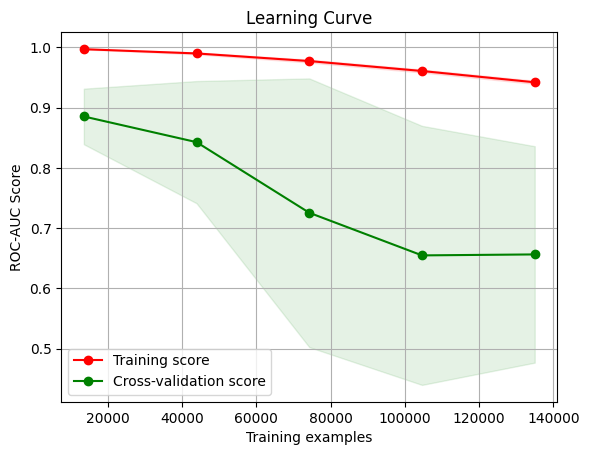

In [85]:
build_learning_curve_plt(train_sizes, train_scores, val_scores)

## Analyze results

In [83]:
from sklearn.metrics import accuracy_score, f1_score
import matplotlib.pyplot as plt


def find_threshold(y_test, y_pred_proba):
    # Define a range of possible thresholds
    thresholds = np.linspace(0, 1, 100)
    accuracies = []

    # Calculate accuracy for each threshold
    for threshold in thresholds:
        y_pred = (y_pred_proba >= threshold).astype(int)
        score = 0.8 * accuracy_score(y_test, y_pred) + 0.2 * f1_score(y_test, y_pred, pos_label=1)
        accuracies.append(score)

    # Find the threshold that provides the highest accuracy
    max_accuracy_index = np.argmax(accuracies)
    optimal_threshold = thresholds[max_accuracy_index]

    print(f"Optimal Threshold for Maximum Score: {optimal_threshold}")
    print(f"Maximum Score: {accuracies[max_accuracy_index]}")

    return optimal_threshold


X = train_data[features]
y_true = train_data.target

y_pred_proba_calibr = model_cls.booster_.predict(X)

optimal_threshold = find_threshold(y_true, y_pred_proba_calibr)

Optimal Threshold for Maximum Score: 0.8585858585858587
Maximum Score: 0.8565994597742382


In [102]:
# Train
train_y_true = train_data.target
train_y_pred_proba = model_cls.booster_.predict(train_data[features])
train_y_pred = (train_y_pred_proba >= optimal_threshold).astype(int)

# Test
test_y_true = test_data.target
test_y_pred_proba = model_cls.booster_.predict(test_data[features])
test_y_pred = (test_y_pred_proba >= optimal_threshold).astype(int)

### ROC Curve

In [85]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc


def plot_roc_curve(y_train, y_test):
    fpr1, tpr1, _ = roc_curve(*y_train)
    roc_auc1 = auc(fpr1, tpr1)

    # fpr2, tpr2, _ = roc_curve(*y_val)
    # roc_auc2 = auc(fpr2, tpr2)

    fpr3, tpr3, _ = roc_curve(*y_test)
    roc_auc3 = auc(fpr3, tpr3)

    plt.figure()
    plt.plot(
        fpr1, tpr1, color="blue", lw=2, label=f"Навчальна вибірка: {roc_auc1:.3f} ({roc_auc1:.2f})", linestyle="--"
    )
    # plt.plot(fpr2, tpr2, color="red", lw=2, label=f"Валідаційна вибірка: {roc_auc2:.3f} ({roc_auc2:.2f})")
    plt.plot(fpr3, tpr3, color="green", lw=2, label=f"Тестова вибірка: {roc_auc3:.3f} ({roc_auc3:.2f})")
    plt.plot([0, 1], [0, 1], color="grey", lw=2, linestyle="--")

    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC curve")
    plt.legend(loc="lower right")
    plt.show()

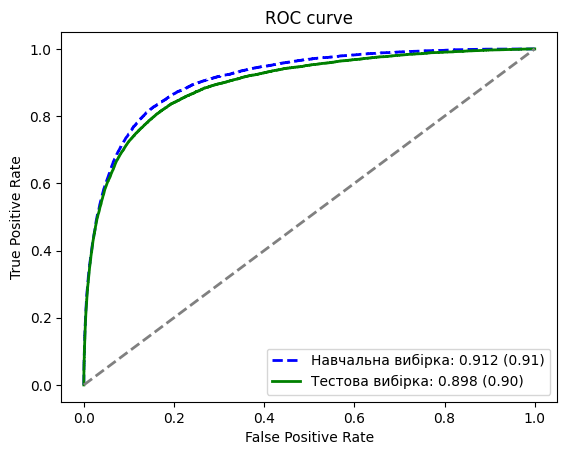

In [103]:
plot_roc_curve((train_y_true, train_y_pred_proba), (test_y_true, test_y_pred_proba))

In [104]:
# Test data

X = test_data[features]
y_pred_proba = test_y_pred_proba
y_pred = test_y_pred
y_true = test_y_true

### Confusion Matrix

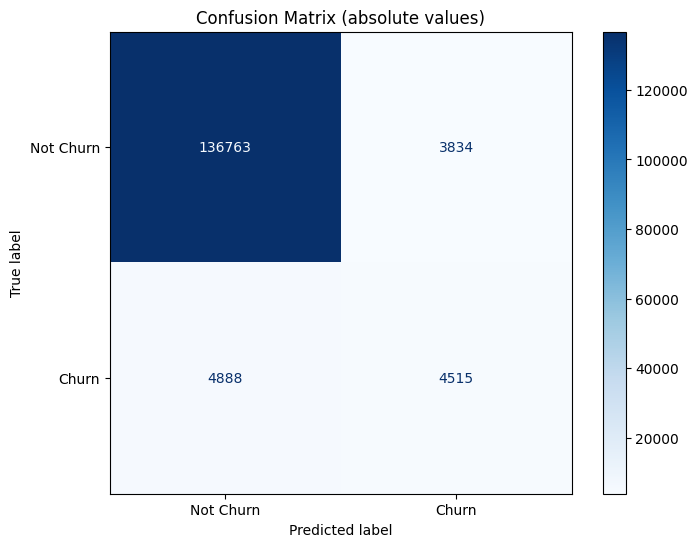

In [105]:
classes = ["Not Churn", "Churn"]

cm = confusion_matrix(y_true, y_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
fig, ax = plt.subplots(figsize=(8, 6))
disp.plot(cmap="Blues", ax=ax)
plt.title("Confusion Matrix (absolute values)")
plt.show()

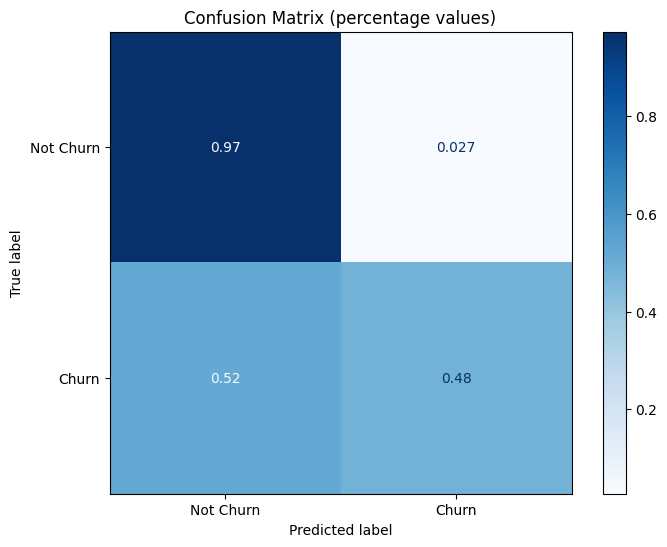

In [106]:
cm = confusion_matrix(y_true, y_pred, normalize="true")

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
fig, ax = plt.subplots(figsize=(8, 6))
disp.plot(cmap="Blues", ax=ax)
plt.title("Confusion Matrix (percentage values)")
plt.show()

### Scoring distribution

In [107]:
import plotly.express as px

pred_df = pd.DataFrame(
    {
        "y_pred_proba": y_pred_proba[y_true == 0],
        "Churn": y_true[y_true == 0],
    }
)

fig = px.histogram(
    pred_df,
    x="y_pred_proba",
    color="Churn",
    marginal="box",
    nbins=100,
    title="Distribution of predicted probabilities (NOT Churn class)",
    color_discrete_map={0: "blue", 1: "red"},
)

fig.update_layout(
    bargap=0.1, xaxis_title="Predicted probability (NOT Churn class)", yaxis_title="Count", legend_title="Class"
)

fig.update_layout(width=1200, height=600)

fig.show()

In [108]:
import plotly.express as px

pred_df = pd.DataFrame(
    {
        "y_pred_proba": y_pred_proba[y_true == 1],
        "Churn": y_true[y_true == 1],
    }
)

fig = px.histogram(
    pred_df,
    x="y_pred_proba",
    color="Churn",
    marginal="box",
    nbins=100,
    title="Distribution of predicted probabilities (Churn class)",
    color_discrete_map={0: "blue", 1: "red"},
)

fig.update_layout(
    bargap=0.1, xaxis_title="Predicted probability (Churn class)", yaxis_title="Count", legend_title="Class"
)

fig.update_layout(width=1000, height=600)

fig.show()

### Conversion

In [112]:
df_pred_train = pd.DataFrame(columns=["pred", "pred_proba", "target"])

df_pred_train["pred"] = y_pred.copy()
df_pred_train["pred_proba"] = y_pred_proba.copy()
df_pred_train["target"] = y_true.astype(int).copy()
data_base = df_pred_train[["pred_proba", "target"]]

# Prediction
data_base = data_base.sort_values(by="pred_proba")
data_base.index = np.arange(1, len(data_base) + 1)
data_base["prediction"] = data_base.index / len(data_base)

# Build
base_rate = (1 - data_base["prediction"]) * 100
base_rate = base_rate.apply(np.floor) + 1

# розбиваємо базу по 5% - якщо потрібно по-іншому - замінюємо 5 на інше число
base_rate = (base_rate / 5).apply(np.ceil)
base_rate = base_rate * 5

data_base["rate"] = base_rate

# формуємо фінальну таблицю, зберігаємо
data_stat = data_base[["pred_proba", "target", "rate"]].groupby(["target", "rate"]).count()
data_stat.reset_index(inplace=True)

data_stat = data_stat.pivot(index="rate", columns="target", values="pred_proba")
data_stat = data_stat.fillna(0)

data_stat_df = data_stat.cumsum().reset_index()

data_stat_df.rename(columns={0: "not_churn", 1: "churn"}, inplace=True)

data_stat_df["conversion"] = (
    data_stat_df["churn"] * 100 / (data_stat_df["churn"] + data_stat_df["not_churn"])
).round(2)

overall_conversion = (total_churn * 100) / (total_churn + total_not_churn)

# Розрахунок Lift для кожного сегмента
data_stat_df["lift"] = data_stat_df["conversion"] / overall_conversion

# Get last row
total_churn = data_stat_df["churn"].iloc[-1]
total_not_churn = data_stat_df["not_churn"].iloc[-1]

data_stat_df["churn_coverage"] = (data_stat_df["churn"] * 100) / total_churn
data_stat_df["not_churn_coverage"] = (data_stat_df["not_churn"] * 100) / total_not_churn

data_stat_df

target,rate,not_churn,churn,conversion,lift,churn_coverage,not_churn_coverage
0,5.0,3267,4233,56.44,9.003510,45.017548,2.323663
1,10.0,8998,6003,40.02,6.384133,63.841327,6.399852
2,15.0,15537,6963,30.95,4.937254,74.050835,11.050734
3,20.0,22445,7556,25.19,4.018398,80.357333,15.964068
4,25.0,29537,7963,21.23,3.386685,84.685739,21.008272
5,30.0,36732,8268,18.37,2.930448,87.929384,26.125735
6,35.0,44030,8470,16.13,2.573115,90.077635,31.316458
7,40.0,51354,8646,14.41,2.298734,91.949378,36.525673
8,45.0,58714,8787,13.02,2.076997,93.448899,41.760493
9,50.0,66107,8893,11.86,1.891949,94.576199,47.018784


### Gain and Lift Charts

<Axes: title={'center': 'Lift Curve'}, xlabel='Percentage of sample', ylabel='Lift'>

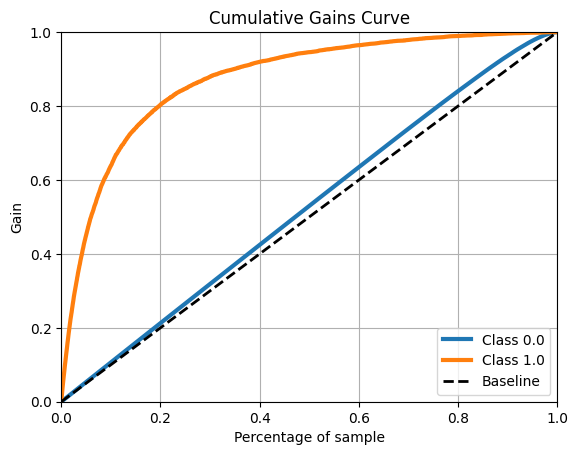

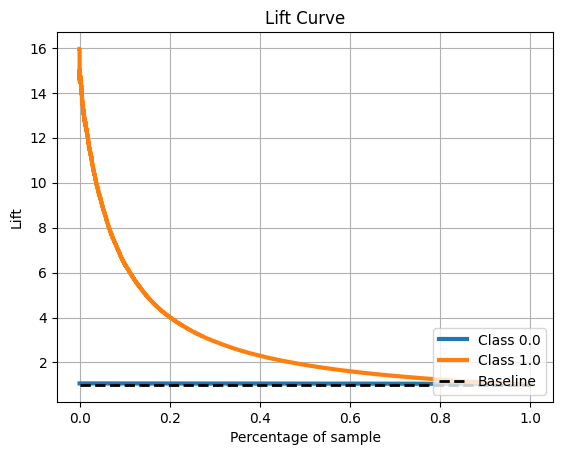

In [113]:
import pandas as pd
import numpy as np
import scikitplot as skplt

y_true = test_data.target
y_pred_prob = model_cls.predict_proba(test_data[features])

skplt.metrics.plot_cumulative_gain(y_true, y_pred_prob)
skplt.metrics.plot_lift_curve(y_true, y_pred_prob)

### Check Threshold Diff

In [114]:
def get_treshold(y_test, y_pred):
    fpr, tpr, thresholds = roc_curve(y_test, y_pred)
    gmeans = np.sqrt(tpr * (1 - fpr))
    ix = np.argmax(gmeans)
    return thresholds[ix]


y_train_true = train_data.target
y_train_pred_prob = model_cls.predict_proba(train_data[features])[:, 1]

y_test_true = test_data.target
y_test_pred_prob = model_cls.predict_proba(test_data[features])[:, 1]

train_threshold = get_treshold(y_train_true, y_train_pred_prob)
test_threshold = get_treshold(y_test_true, y_test_pred_prob)

print("Treshold (Train): ", train_threshold)
print("Treshold (Test): ", test_threshold)
print("Diff: ", train_threshold - test_threshold)

Treshold (Train):  0.5096326302409376
Treshold (Test):  0.48346774786744723
Diff:  0.026164882373490406


## Analyze features

In [115]:
importances = model_cls.booster_.feature_importance(importance_type="gain")
importance_df = pd.DataFrame(list(zip(features, importances)), columns=["Feature", "Importance"])

# Report
feature_importances = importance_df.sort_values(by="Importance", ascending=False)
feature_importances = feature_importances[feature_importances.Importance > 5000]

list(feature_importances.Feature)

['num_act_days_min_mnt3',
 'device_days_usage',
 'num_act_days_mea_mnt3',
 'loc_market_share',
 'num_act_days_mea_mnt1',
 'voice_in_td_cnt_min_total',
 'num_act_days_std_total',
 'voice_in_tar_dur_min_mnt1',
 'voice_in_td_cnt_mea_mnt1',
 'lt',
 'days_of_end_last_ppm',
 'voice_out_tar_dur_min_mnt1',
 'days_of_last_ppm',
 'all_cnt_min_mnt3',
 'sms_in_cnt_std_mnt3',
 'day_end_gba',
 'all_cnt_std_total',
 'loc_is_obl_center',
 'other_cnt_sms_in_sum',
 'Balance_uah',
 'casual_topic_cnt_sms_in_sum',
 'voice_mts_in_dwork_part_mea_mnt3',
 'conn_out_uniq_cnt_min_total',
 'voice_in_tar_dur_min_total',
 'conn_out_uniq_cnt_mea_mnt1',
 'num_act_days_std_mnt3',
 'imei_mean_days_usage',
 'all_cnt_std_mnt1',
 'all_cnt_std_mnt3',
 'voice_in_kievstar_part_mea_total',
 'voice_in_td_cnt_td_total',
 'casual_act_cnt_sms_in',
 'content_cnt_mea_mnt3',
 'sms_in_cnt_std_total',
 'MAX_of_day_cnt_susp_app_sum',
 'voice_mts_in_dwork_part_mea_mnt1',
 'sum_paym_6_month',
 'data_3g_tv_cnt_std_mnt3',
 'imei_mean_long_

In [116]:
import plotly.express as px

fig = px.bar(feature_importances[:50], x="Importance", y="Feature", title="Feature Importances")
fig.update_layout(yaxis={"categoryorder": "total ascending"}, width=800, height=2000)
fig.show()

In [117]:
explainer = shap.TreeExplainer(model_cls)
shap_values = explainer(test_data[features])

In [118]:
shap_importance = pd.DataFrame(
    list(zip(features, np.abs(shap_values.values).mean(axis=0))), columns=["feature", "importance"]
).sort_values(by="importance", ascending=False)

shap_features = shap_importance[:12]

list(shap_features.feature)

['num_act_days_min_mnt3',
 'device_days_usage',
 'num_act_days_std_total',
 'num_act_days_mea_mnt1',
 'lt',
 'num_act_days_mea_mnt3',
 'Balance_uah',
 'loc_market_share',
 'voice_in_kievstar_part_mea_total',
 'day_end_gba',
 'voice_in_td_cnt_td_total',
 'sms_in_cnt_std_mnt3']

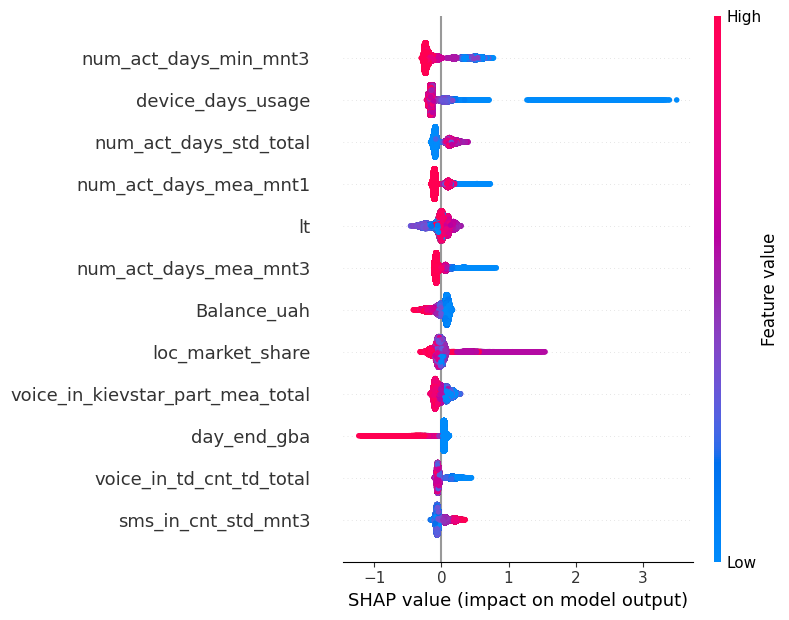

In [119]:
shap.summary_plot(shap_values, test_data[features], max_display=len(shap_features))

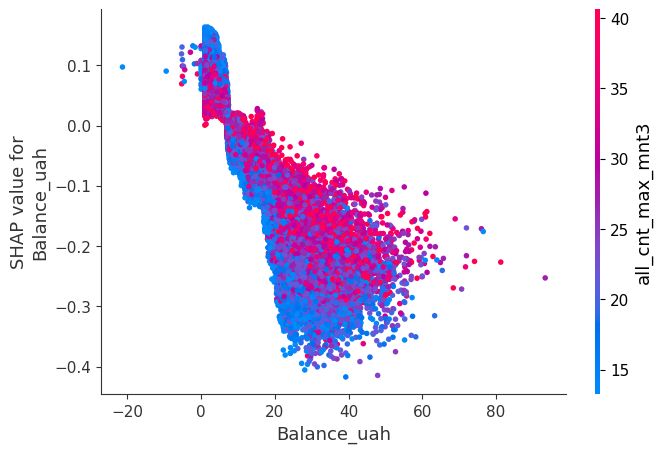

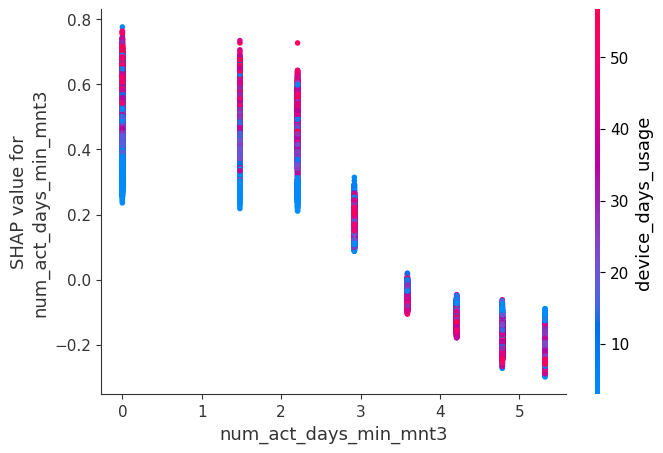

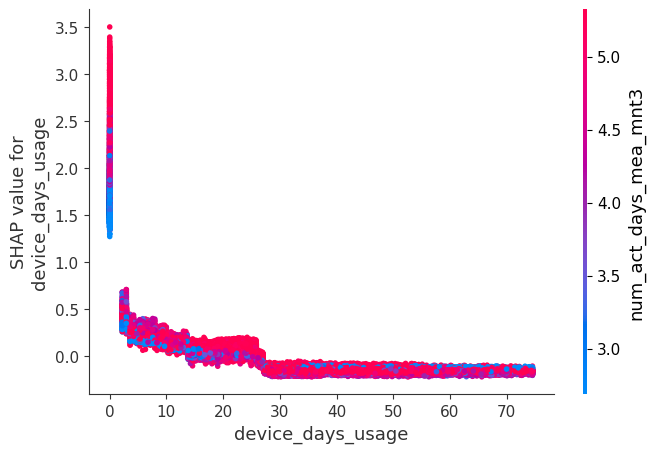

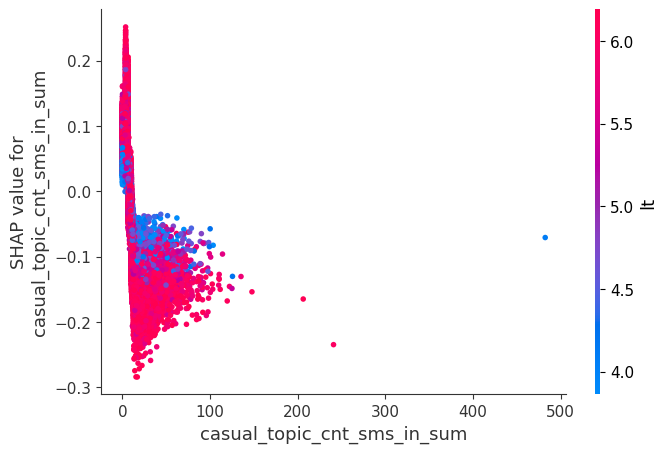

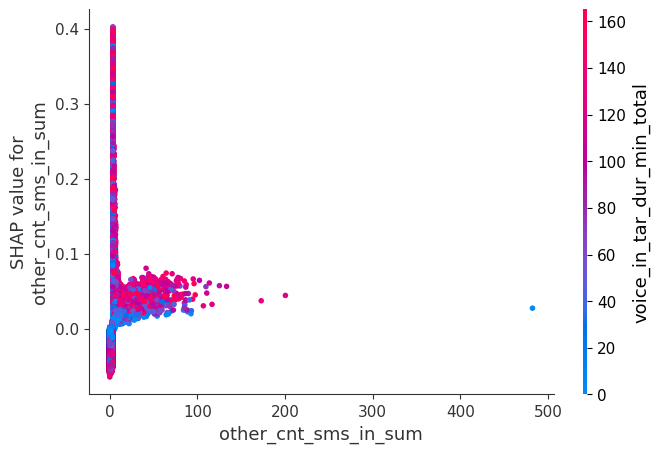

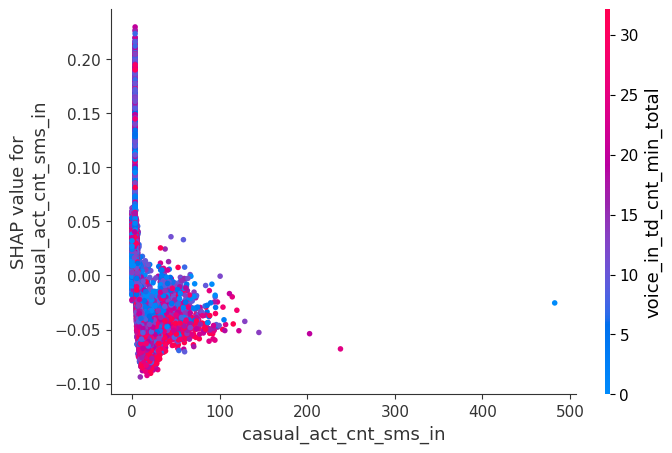

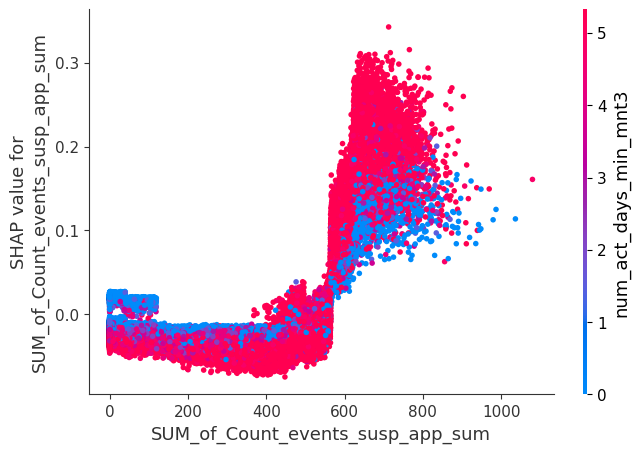

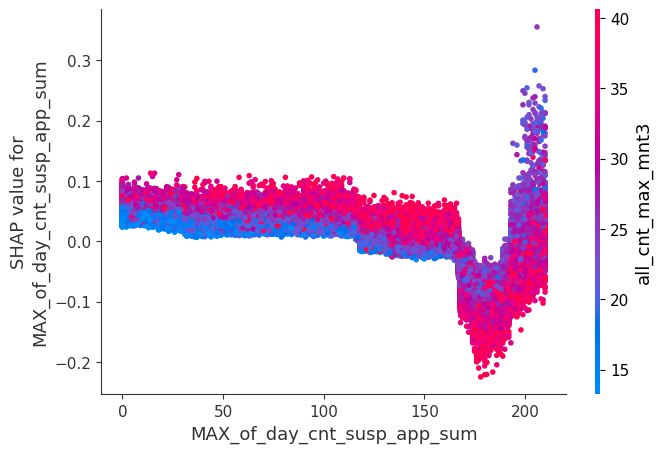

In [121]:
feature_importances_nams = feature_importances["Feature"].values


def render_shap_plot(feature_name):
    shap.dependence_plot(feature_name, shap_values.values, test_data[features])


render_shap_plot("Balance_uah")
render_shap_plot("num_act_days_min_mnt3")
render_shap_plot("device_days_usage")
render_shap_plot("casual_topic_cnt_sms_in_sum")
render_shap_plot("other_cnt_sms_in_sum")
render_shap_plot("casual_act_cnt_sms_in")
render_shap_plot("SUM_of_Count_events_susp_app_sum")
render_shap_plot("MAX_of_day_cnt_susp_app_sum")

In [123]:
sub_df = test_data[(test_data.casual_act_cnt_sms_in <= 100) & test_data.casual_act_cnt_sms_in > 0][features]
sub_explainer = shap.TreeExplainer(model_cls)
sub_shap_values = explainer(sub_df)

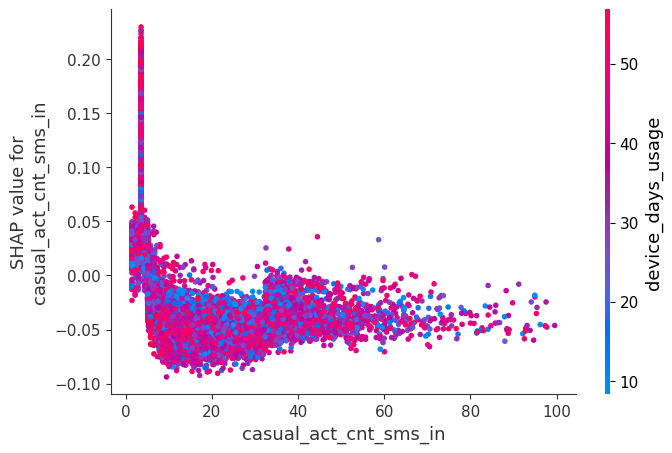

In [126]:
shap.dependence_plot(
    "casual_act_cnt_sms_in", sub_shap_values.values, sub_df, interaction_index="device_days_usage"
)

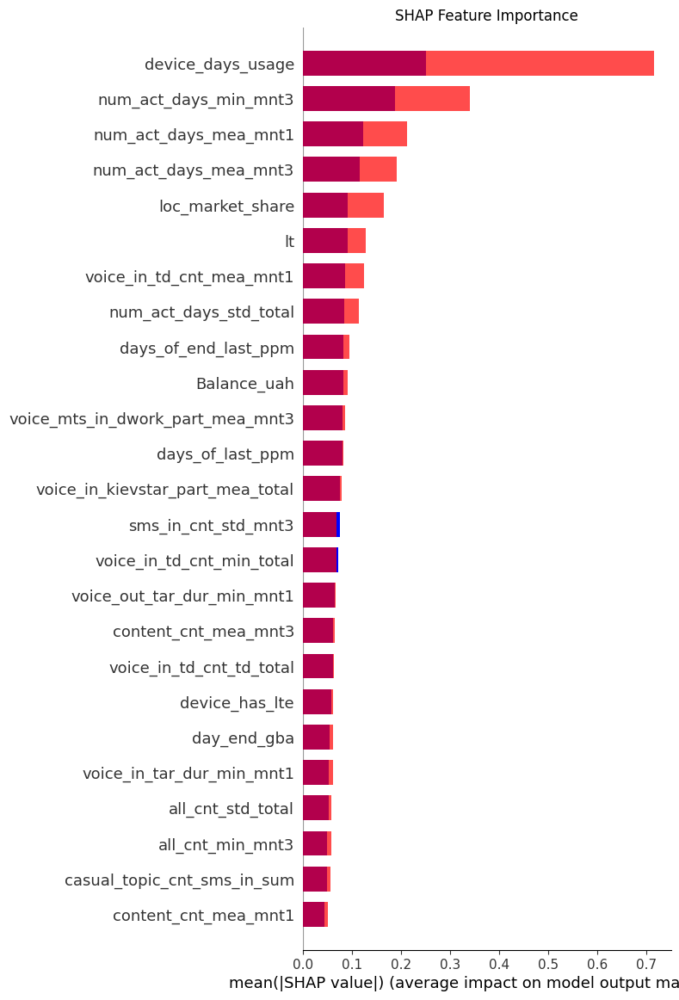

In [127]:
X_test = test_data[features]
y_test = test_data.target

# Розділення SHAP значень за класами
shap_values_0 = shap_values.values[y_test == 0]
shap_values_1 = shap_values.values[y_test == 1]

plt.figure()
shap.summary_plot(shap_values_0, X_test[y_test == 0], plot_type="bar", show=False, color="blue", max_display=25)

# Overlay the plot for the second class (red with opacity)
shap.summary_plot(shap_values_1, X_test[y_test == 1], plot_type="bar", show=False, color="red", max_display=25)

# Adjust the transparency of the red bars
for patch in plt.gca().patches:
    if patch.get_facecolor() == (1.0, 0.0, 0.0, 1.0):
        patch.set_facecolor((1.0, 0.0, 0.0, 0.7))

plt.title("SHAP Feature Importance")
plt.show()